# Eddy and particle visualisation

Created by: Stella Berzina (stella.berzina@usys.ethz.ch)

Created on: 25.10.2024

Last edited: 25.10.2024

Places for resources and inspiration:
1. https://py-eddy-tracker.readthedocs.io/en/stable/python_module/07_cube_manipulation/pet_particles_drift.html
2. https://py-eddy-tracker.readthedocs.io/en/stable/python_module/06_grid_manipulation/pet_advect.html#particle-forward
3. https://github.com/liutongya/GLED/blob/master/scripts/10.how_to_use_GLED.ipynb
4. https://github.com/liutongya/GLED/blob/master/scripts/06.RCLV_identification.ipynb
5. 

In [1]:
# from scipy.interpolate import CloughTocher2DInterpolator, LinearNDInterpolator, NearestNDInterpolator
from numpy import arange, ones
import matplotlib as mpl
import matplotlib.lines as mlines
from matplotlib.cm import get_cmap
from matplotlib import colors 
from matplotlib.colors import ListedColormap
from matplotlib.figure import Figure

from datetime import datetime, timedelta
from netCDF4 import Dataset

import io
import os
import warnings
warnings.filterwarnings("ignore")

# from concurrent.futures import ProcessPoolExecutor
# from concurrent.futures import ThreadPoolExecutor

import dask
# from dask_jobqueue import SLURMCluster
from dask.distributed import Client

import cartopy.crs as ccrs
from cartopy.mpl.ticker import (LongitudeFormatter, LatitudeFormatter,LatitudeLocator)
import cartopy.feature as cfeature

import xarray as xr
import numpy as np
import matplotlib.pylab as plt
import matplotlib.cm as cm
from scipy.interpolate import CloughTocher2DInterpolator, LinearNDInterpolator, NearestNDInterpolator
import glob
import intake
from pathlib import Path
import dask
# import cmocean.cm as cmo #also for pretty color palettes
import pandas as pd
dask.config.set({"array.slicing.split_large_chunks": True}) 
import sys
import csv
# to access intake catalog of eerie
eerie_cat=intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")


###Lexieland
import os,sys
from config import *

sys.path.append('./RCLVatlas')
from subfunctions_for_RCLV_atlas import read_RCLV_CSV_untracked,read_RCLV_CSV_tracked,save_RCLV_CSV
from mainfunctions_for_RCLV_atlas import *

from scipy.spatial import ConvexHull



In [2]:
traj_path= "/work/bk1377/b382618/RCLVs/32day/lang_traj/20100525_32days_runtime_20min_timestep_particle_start_lat_10.0_40.0_lon_180.0_210.0_spatial_step_0.03125_6hr_output_freq.zarr"

In [11]:
# traj_path_8='/work/bk1377/b382618/RCLVs/8day/lang_traj/20101227_8days_runtime_20min_timestep_particle_start_lat_10.0_40.0_lon_180.0_210.0_spatial_step_0.03125_6hr_output_freq.zarr'
traj_path_8 = '/work/bk1377/b382618/RCLVs/32day/lang_traj/20100525_32days_runtime_20min_timestep_particle_start_lat_10.0_40.0_lon_180.0_210.0_spatial_step_0.03125_6hr_output_freq.zarr'


In [3]:
traj_path_8_2='/work/bk1377/b382618/RCLVs/8day/lang_traj/20101219_8days_runtime_20min_timestep_particle_start_lat_10.0_40.0_lon_180.0_210.0_spatial_step_0.03125_6hr_output_freq.zarr'


In [2]:
traj_path = "/work/bk1377/b382618/RCLVs/f8day/lang_traj/20101203_8days_runtime_20min_timestep_particle_start_lat_10.0_40.0_lon_180.0_210.0_spatial_step_0.03125_6hr_output_freq.zarr"

In [4]:
# RCLV_path = "/work/bk1377/b382618/RCLVs/8day/RCLV_dir_2/changedRCLV_20100501_20101227_atlas.csv"
# open as csv file which is a list of lists
RCLV_path = '/work/bk1377/b382618/RCLVs/32day/RCLV_dir/changedRCLV_20100525_20101203_untracked.csv'


RCLV_data = []
with open(RCLV_path) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    i = 0
    for row in csv_reader:
        if i == 0:
            RCLV_data.append(row)
        else:
            #reformat so that everything except for the date and orientation is a float
            RCLV_data.append([row[0],float(row[1]),row[2]] + [float(i) for i in row[3:]])
        i += 1

RCLV_data = np.array(RCLV_data,dtype=object) # Convert the list to a NumPy array


In [17]:
# traj_path_8_3='/work/bk1377/b382618/RCLVs/8day/lang_traj/20101211_8days_runtime_20min_timestep_particle_start_lat_10.0_40.0_lon_180.0_210.0_spatial_step_0.03125_6hr_output_freq.zarr'
# traj_path_8_4='/work/bk1377/b382618/RCLVs/8day/lang_traj/20101203_8days_runtime_20min_timestep_particle_start_lat_10.0_40.0_lon_180.0_210.0_spatial_step_0.03125_6hr_output_freq.zarr'


In [3]:
ds_8 = xr.open_zarr(traj_path)

In [4]:
ds_8 = xr.open_zarr(traj_path_8)
# ds_8_2 = xr.open_zarr(traj_path_8_2)
# ds_8_3 = xr.open_zarr(traj_path_8_3)
# ds_8_4 = xr.open_zarr(traj_path_8_4)


# ds_8_2

NameError: name 'traj_path_8' is not defined

In [4]:
ds_8.time.values

array([['2010-12-03T00:00:00.000000000', '2010-12-03T06:00:00.000000000',
        '2010-12-03T12:00:00.000000000', ...,
        '2010-12-10T06:00:00.000000000', '2010-12-10T12:00:00.000000000',
        '2010-12-10T18:00:00.000000000'],
       ['2010-12-03T00:00:00.000000000', '2010-12-03T06:00:00.000000000',
        '2010-12-03T12:00:00.000000000', ...,
        '2010-12-10T06:00:00.000000000', '2010-12-10T12:00:00.000000000',
        '2010-12-10T18:00:00.000000000'],
       ['2010-12-03T00:00:00.000000000', '2010-12-03T06:00:00.000000000',
        '2010-12-03T12:00:00.000000000', ...,
        '2010-12-10T06:00:00.000000000', '2010-12-10T12:00:00.000000000',
        '2010-12-10T18:00:00.000000000'],
       ...,
       ['2010-12-03T00:00:00.000000000', '2010-12-03T06:00:00.000000000',
        '2010-12-03T12:00:00.000000000', ...,
        '2010-12-10T06:00:00.000000000', '2010-12-10T12:00:00.000000000',
        '2010-12-10T18:00:00.000000000'],
       ['2010-12-03T00:00:00.000000000', '20

In [6]:
# Extract latitude, longitude, and time or depth, assuming they're named as such
lons = ds_8['lon']  # Shape: (trajectory, obs)
lats = ds_8['lat']  # Shape: (trajectory, obs)
times = ds_8['time']  # Shape: (trajectory, obs), optional

In [7]:
# Extract latitude, longitude, and time or depth, assuming they're named as such
lons2 = ds_8_2['lon']  # Shape: (trajectory, obs)
lats2 = ds_8_2['lat']  # Shape: (trajectory, obs)
times2 = ds_8_2['time']  # Shape: (trajectory, obs), optional

In [26]:
# Extract latitude, longitude, and time or depth, assuming they're named as such
lons3 = ds_8_3['lon']  # Shape: (trajectory, obs)
lats3 = ds_8_3['lat']  # Shape: (trajectory, obs)
times3 = ds_8_3['time']  # Shape: (trajectory, obs), optional

In [27]:
# Extract latitude, longitude, and time or depth, assuming they're named as such
lons4 = ds_8_4['lon']  # Shape: (trajectory, obs)
lats4 = ds_8_4['lat']  # Shape: (trajectory, obs)
times4 = ds_8_4['time']  # Shape: (trajectory, obs), optional

## 1. One plot

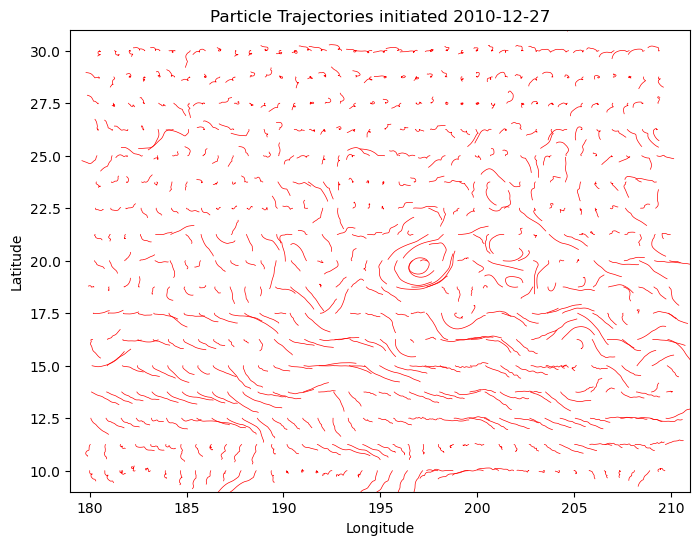

In [20]:
plt.figure(figsize=(8, 6))
for i in range(0, lons.shape[0], 1000):# Adjust step size as needed for fewer trajectories in the plot
        plt.plot(lons[i, :], lats[i, :], '-', linewidth=0.5, color="r")

        # for i in range(0, lons2.shape[0], 10000):  # Adjust step size as needed for fewer trajectories in the plot
        #     plt.plot(lons2[i, :], lats2[i, :], '-', linewidth=0.5, color="b")
plt.xlim([179, 211])  # Set longitude limits
plt.ylim([9, 31])    # Set latitude limits        
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Particle Trajectories initiated ' + str(times.values[0][0])[:10])
# plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/'+str(t)+ '.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()



## 2. For animation

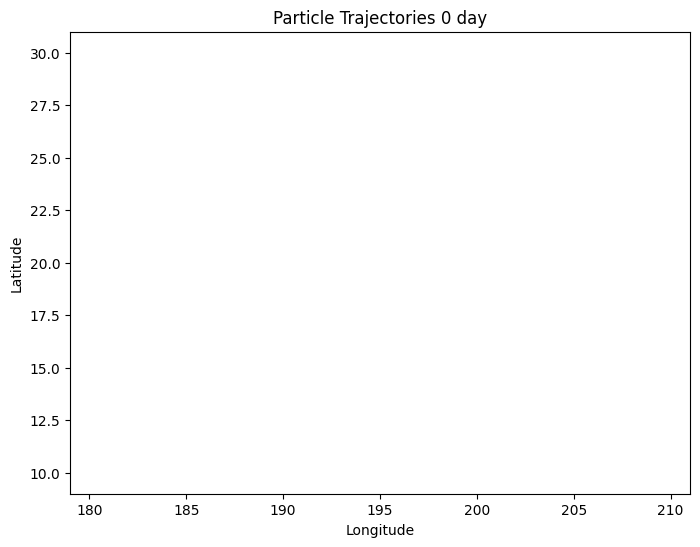

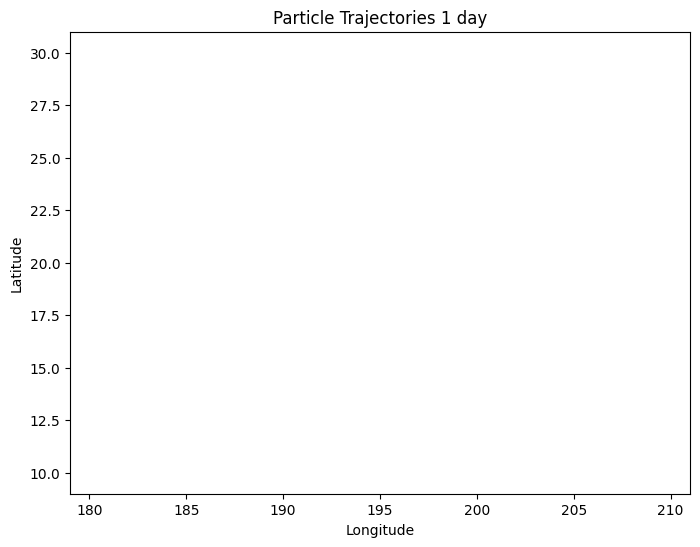

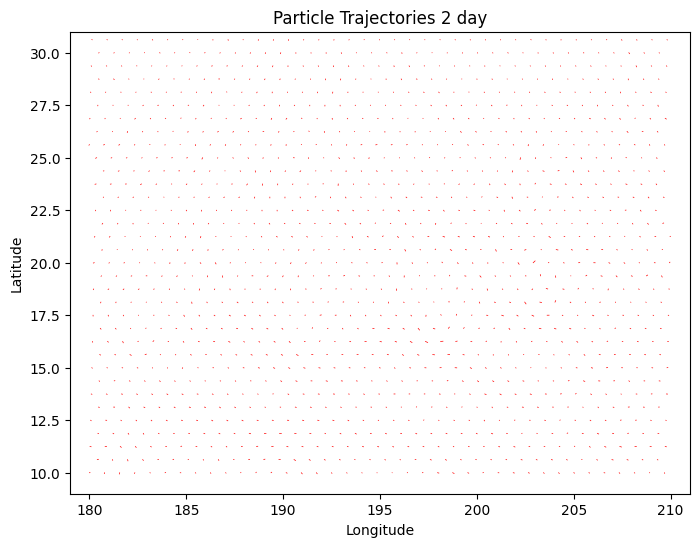

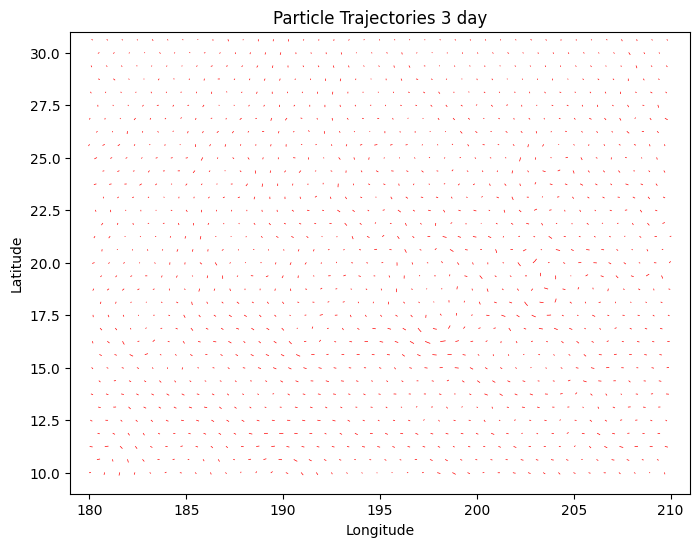

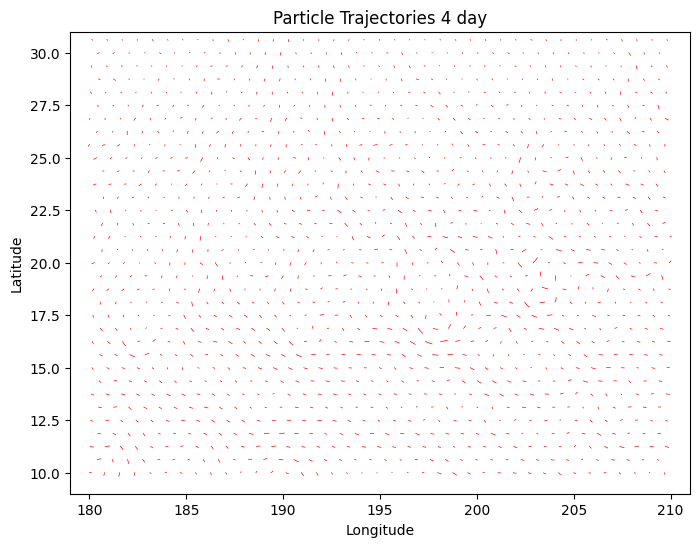

...

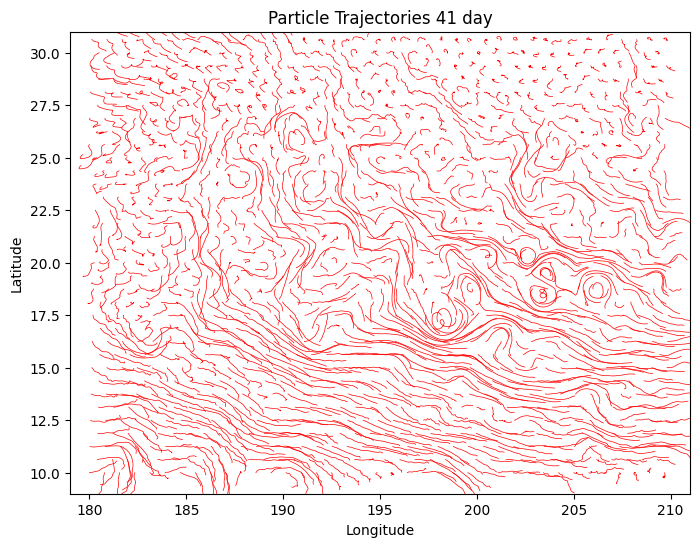

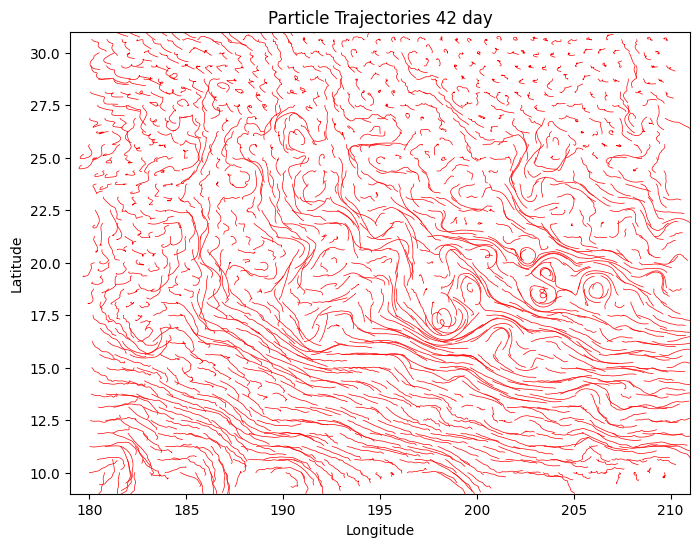

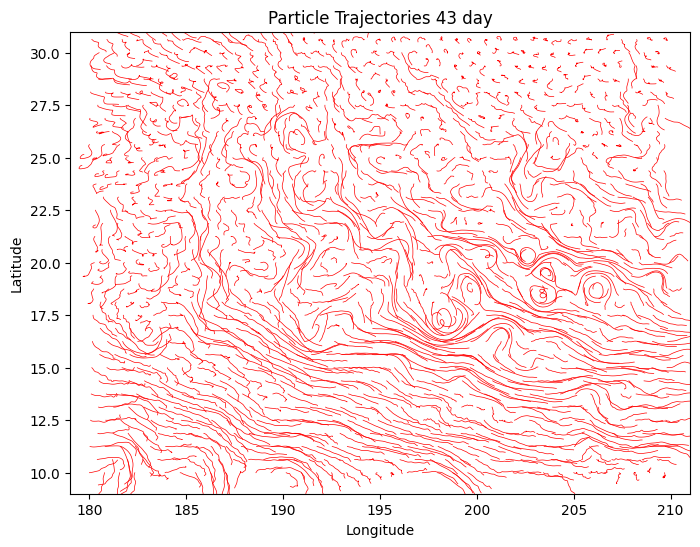

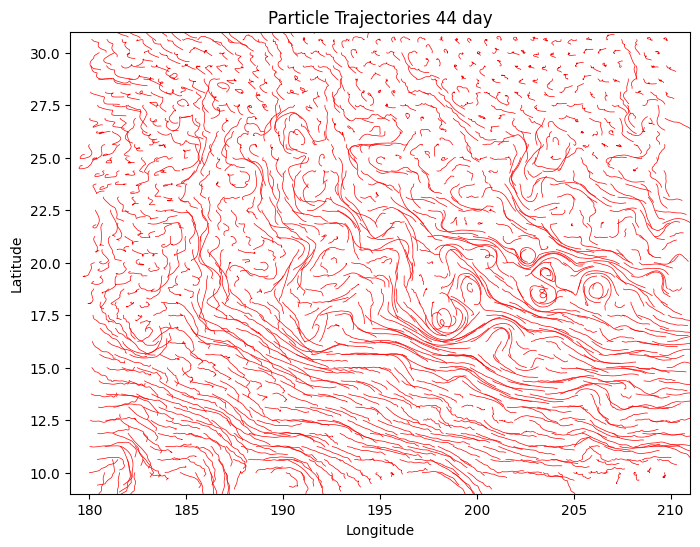

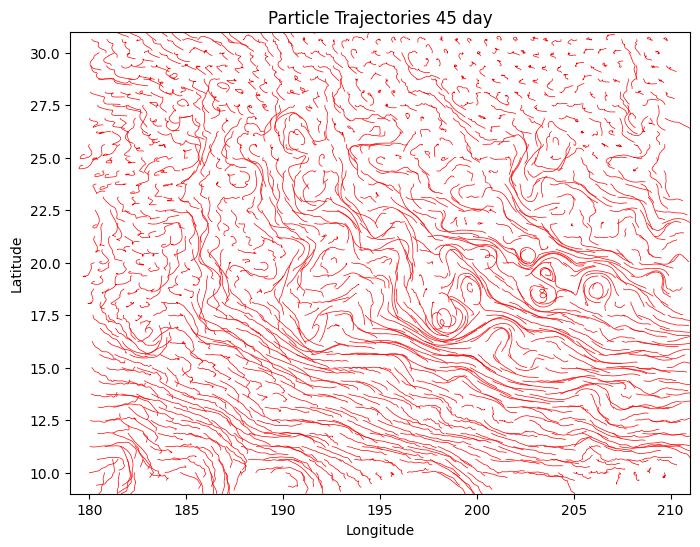

In [ ]:
for t in range(0, times.shape[1]):
    plt.figure(figsize=(8, 6))
    for i in range(0, lons.shape[0], 500):# Adjust step size as needed for fewer trajectories in the plot
            plt.plot(lons[i, 0:t], lats[i, 0:t], '-', linewidth=0.5, color="r")
    
            # for i in range(0, lons2.shape[0], 10000):  # Adjust step size as needed for fewer trajectories in the plot
            #     plt.plot(lons2[i, :], lats2[i, :], '-', linewidth=0.5, color="b")
    plt.xlim([179, 211])  # Set longitude limits
    plt.ylim([9, 31])    # Set latitude limits        
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Particle Trajectories ' + str(t) + ' day')
    # plt.grid(True)
    plt.savefig('/home/b/b382618/eddy_figs/trajectories/trajectories_red_simple/32_day/'+str(t)+ '.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()


## 3. Adding RCLVs to one trajectory file - NOT DONE

KeyboardInterrupt: 

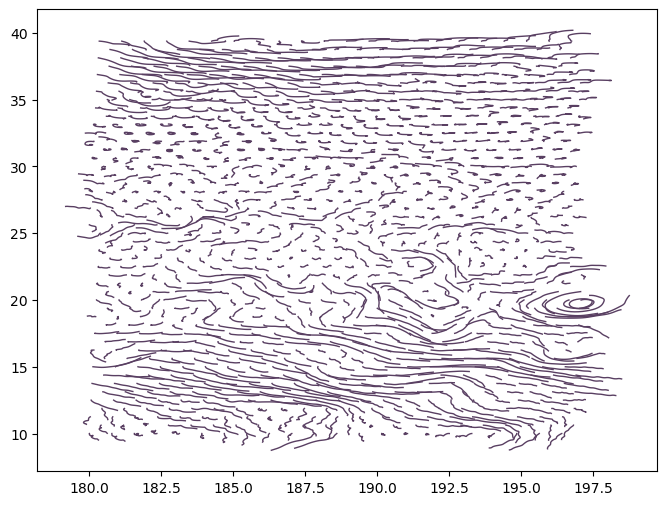

In [62]:
fontsize = 18
plt.figure(figsize=(8, 6))

# plot one trajectory time
for i in range(0, lons.shape[0], 500):# Adjust step size as needed for fewer trajectories in the plot
        plt.plot(lons[i, :], lats[i, :], '-', linewidth=lw, color='#593f62')

date_bad = str(times.values[0][0])[:10]
date_good=int(date_bad.replace("-", ""))
print(date_good)
# Plot the RCLVs for the given date
RCLV_data = np.array(RCLV_data,dtype=object)
RCLV_data_this_day = RCLV_data[np.where([r[0]==str(date_good) for r in RCLV_data])[0]]
RCLV_bnds = [r[9:] for r in RCLV_data_this_day] # boundary coordinates
RCLV_orientations = [r[2] for r in RCLV_data_this_day] # eddy polarity

for i in np.arange(0,len(RCLV_bnds)):
    x_bnds = [float(coord) for coord in RCLV_bnds[i][0::2]]
    y_bnds = [float(coord) for coord in RCLV_bnds[i][1::2]]

    if RCLV_orientations[i] == 'anti':
        color = '#FF0000'
    else:
        color = '#4242FF'
    plt.plot(x_bnds,y_bnds,linewidth=2,c=color)

plt.show()

## 4. Add multiple trajectory days

## 5. Select particles within the RCLVs

To do this I think I can use LL functions

### 5.1 Try Lexies function

#### Extract polygon to try on

In [7]:
date_good=2010525

In [8]:
RCLV_data = np.array(RCLV_data,dtype=object)
RCLV_data_this_day = RCLV_data[np.where([r[0]==str(date_good) for r in RCLV_data])[0]]
RCLV_bnds = [r[9:] for r in RCLV_data_this_day] # boundary coordinates

In [9]:
RCLV_data_this_day

array([], dtype=object)

In [10]:
onep=RCLV_bnds[1]
onep

IndexError: list index out of range

You need polygon in vertices (x and y) format for the function to work

In [9]:
vertices = [[onep[i], onep[i + 1]] for i in range(0, len(onep), 2)]
vertices

[[197.15625, 20.46875],
 [197.1875, 20.46875],
 [197.21875, 20.46875],
 [197.25, 20.46875],
 [197.28125, 20.46875],
 [197.3125, 20.46875],
 [197.34375, 20.46875],
 [197.375, 20.46875],
 [197.40625, 20.46875],
 [197.4375, 20.4375],
 [197.46875, 20.4375],
 [197.5, 20.4375],
 [197.5, 20.4375],
 [197.53125, 20.4375],
 [197.5625, 20.40625],
 [197.5625, 20.40625],
 [197.59375, 20.375],
 [197.59375, 20.375],
 [197.625, 20.34375],
 [197.625, 20.34375],
 [197.65625, 20.3125],
 [197.65625, 20.28125],
 [197.65625, 20.28125],
 [197.6875, 20.25],
 [197.6875, 20.21875],
 [197.6875, 20.21875],
 [197.6875, 20.1875],
 [197.71875, 20.15625],
 [197.71875, 20.15625],
 [197.71875, 20.125],
 [197.75, 20.09375],
 [197.75, 20.0625],
 [197.75, 20.0625],
 [197.75, 20.03125],
 [197.75, 20.0],
 [197.75, 19.96875],
 [197.75, 19.9375],
 [197.78125, 19.90625],
 [197.78125, 19.875],
 [197.78125, 19.875],
 [197.8125, 19.875],
 [197.8125, 19.875],
 [197.84375, 19.875],
 [197.875, 19.875],
 [197.875, 19.875],
 [197.9062

#### Get lat and lon fields to extract the particles from

In [10]:
traj_lat=ds_8.lat[:,0].values
traj_lon=ds_8.lon[:,0].values


In [11]:
traj_lat_unique = np.unique(traj_lat)
traj_lon_unique = np.unique(traj_lon)

traj_lon_unique

array([180.     , 180.03125, 180.0625 , 180.09375, 180.125  , 180.15625,
       180.1875 , 180.21875, 180.25   , 180.28125, 180.3125 , 180.34375,
       180.375  , 180.40625, 180.4375 , 180.46875, 180.5    , 180.53125,
       180.5625 , 180.59375, 180.625  , 180.65625, 180.6875 , 180.71875,
       180.75   , 180.78125, 180.8125 , 180.84375, 180.875  , 180.90625,
       180.9375 , 180.96875, 181.     , 181.03125, 181.0625 , 181.09375,
       181.125  , 181.15625, 181.1875 , 181.21875, 181.25   , 181.28125,
       181.3125 , 181.34375, 181.375  , 181.40625, 181.4375 , 181.46875,
       181.5    , 181.53125, 181.5625 , 181.59375, 181.625  , 181.65625,
       181.6875 , 181.71875, 181.75   , 181.78125, 181.8125 , 181.84375,
       181.875  , 181.90625, 181.9375 , 181.96875, 182.     , 182.03125,
       182.0625 , 182.09375, 182.125  , 182.15625, 182.1875 , 182.21875,
       182.25   , 182.28125, 182.3125 , 182.34375, 182.375  , 182.40625,
       182.4375 , 182.46875, 182.5    , 182.53125, 

In [12]:
x_points_inside, y_points_inside = find_polygon_pts(vertices,traj_lon_unique,traj_lat_unique)

In [13]:
eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,0) #day 0 data


#### Try to plot them

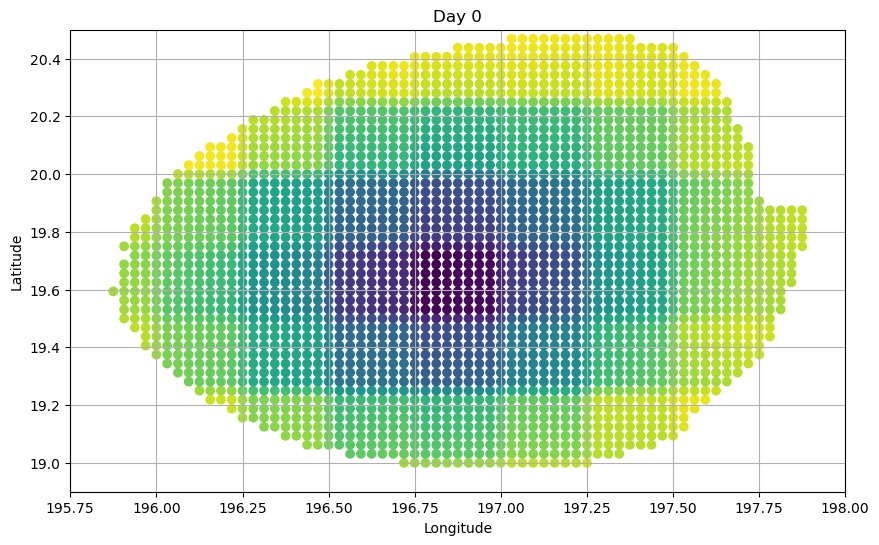

In [104]:
day=0
eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data

plt.figure(figsize=(10, 6))
plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
plt.xlim([195.75, 198])  # Set longitude limits
plt.ylim([18.9, 20.5]) 
plt.grid(True)
plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

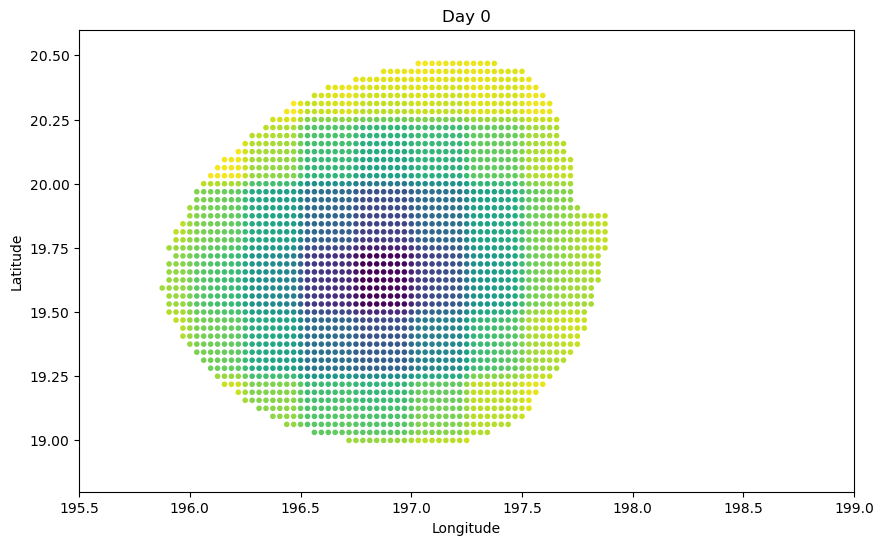

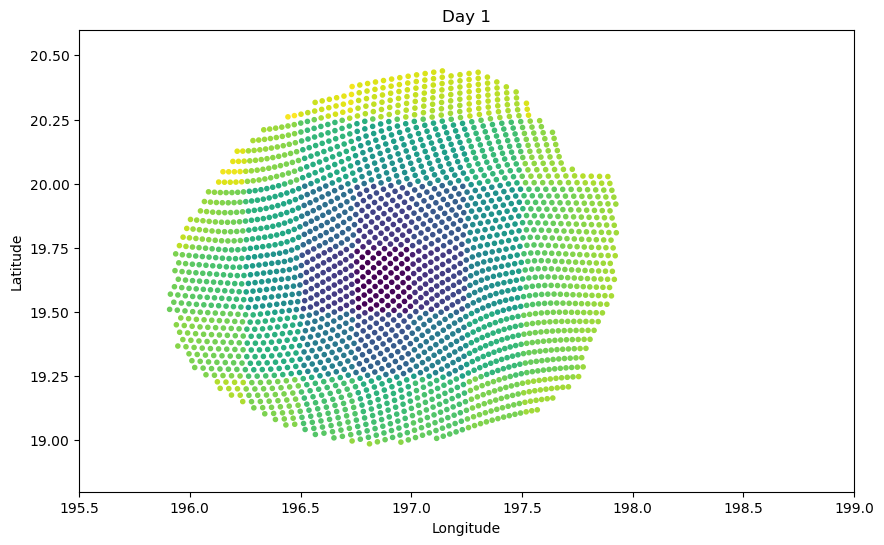

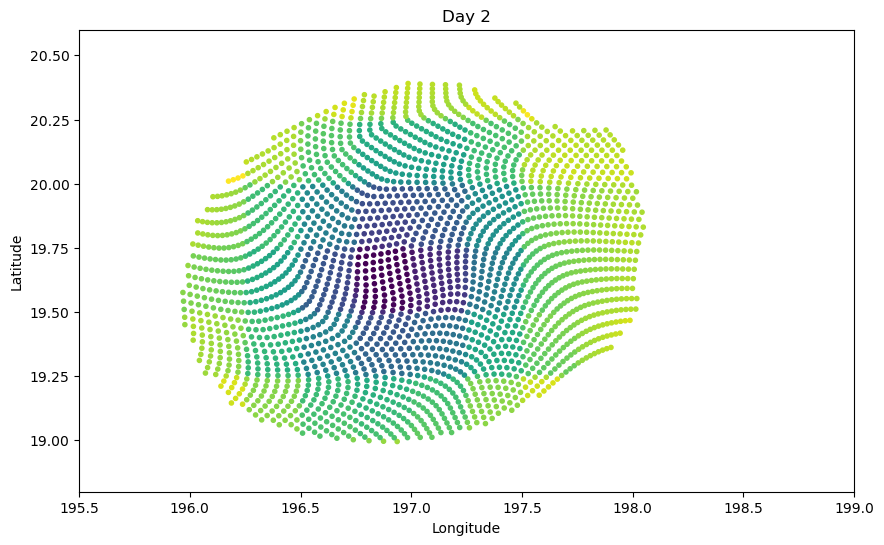

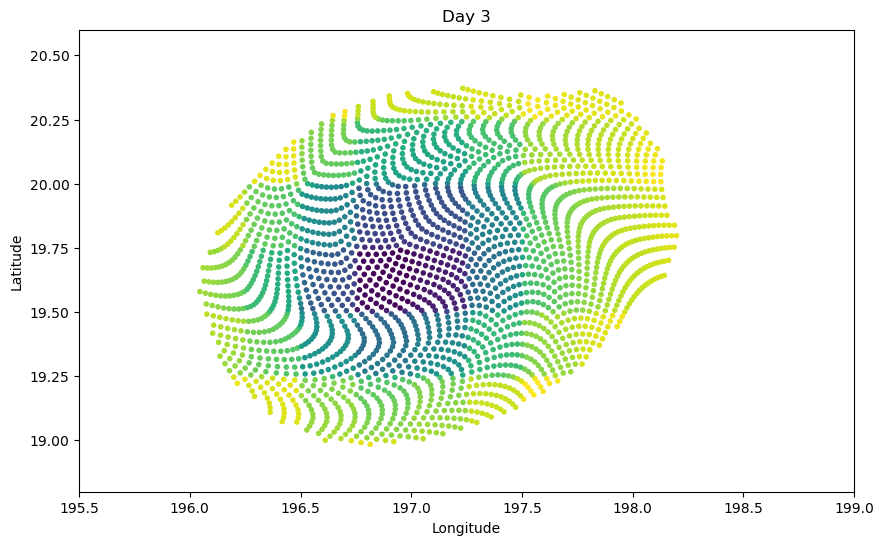

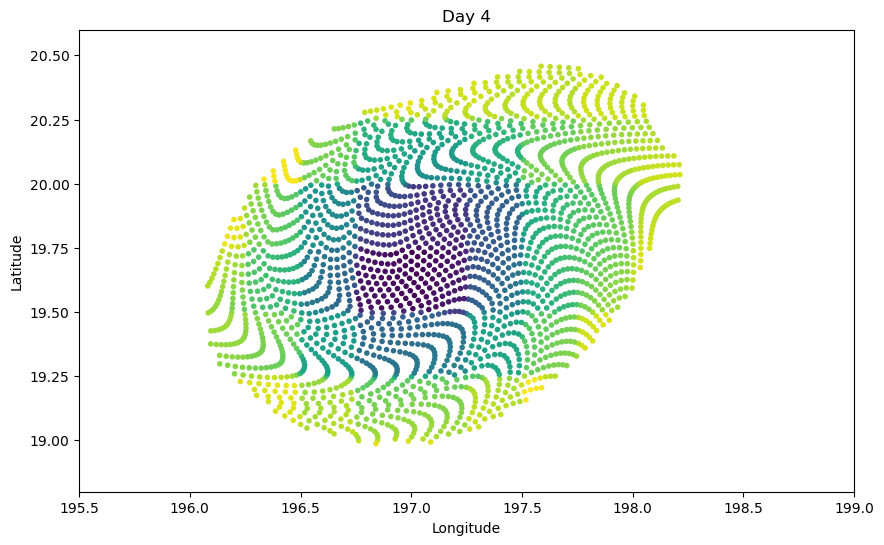

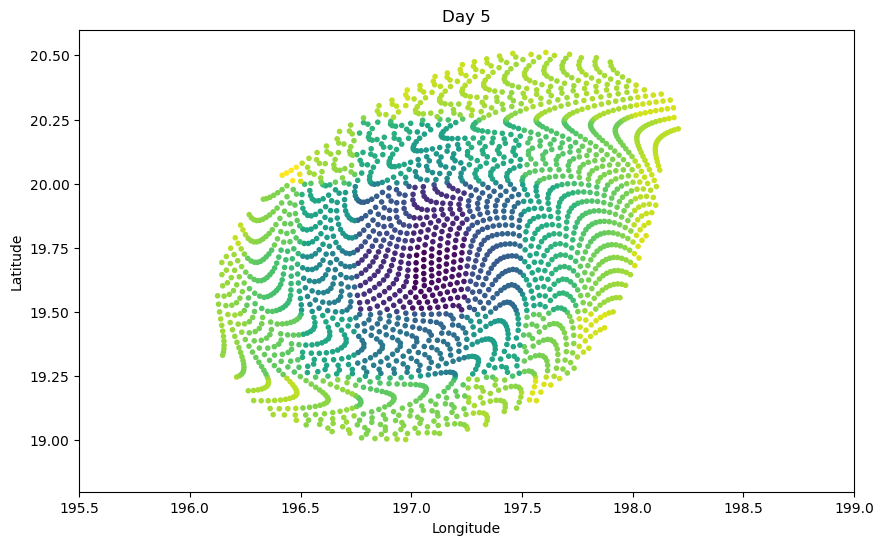

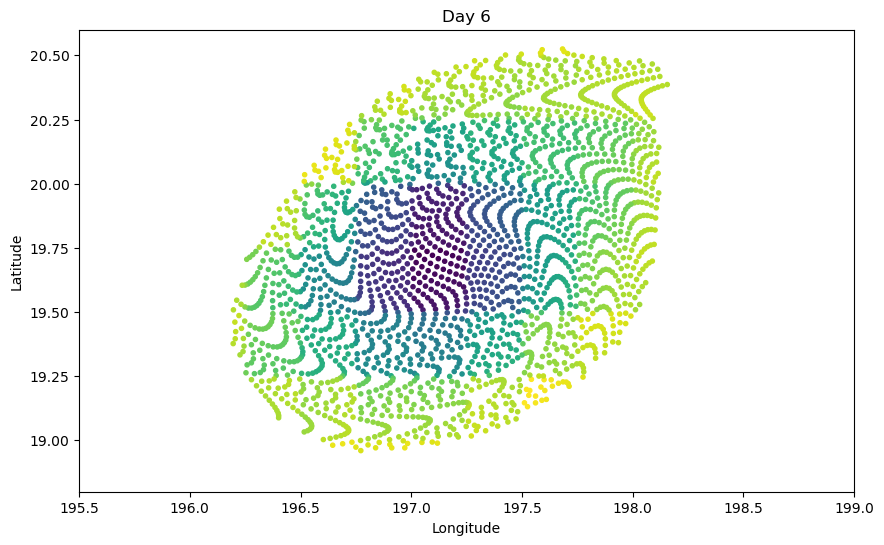

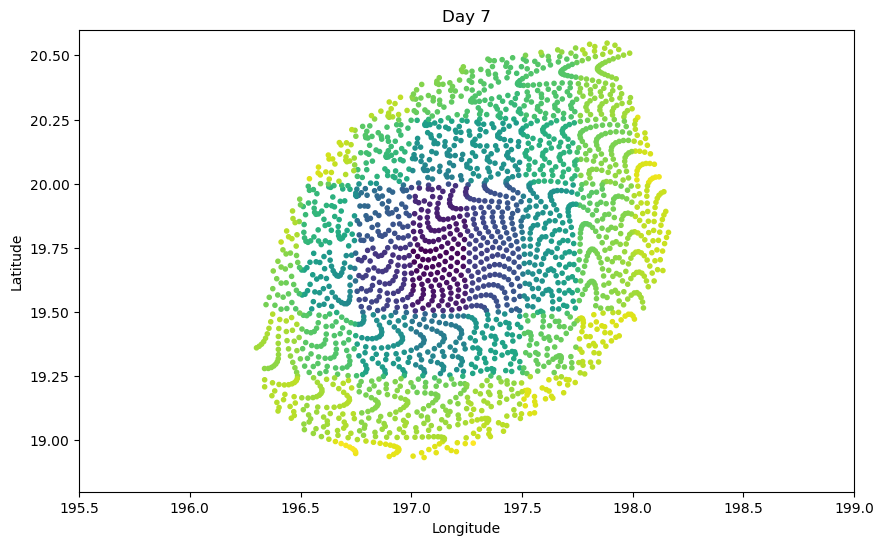

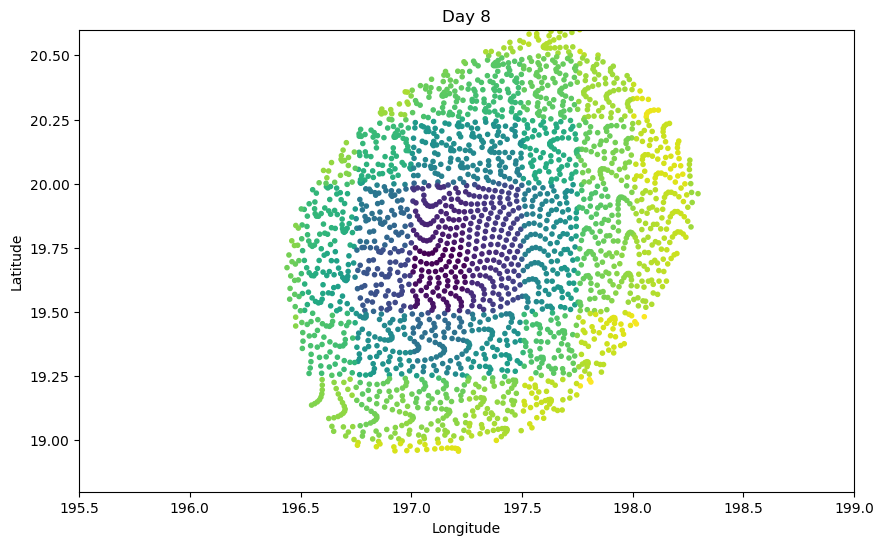

In [115]:
for i in range(0,9):
    day=i
    eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data
    
    plt.figure(figsize=(10, 6))
    # plt.grid(True)
    plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o', s=9)
    
    # Add labels and title
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title("Day " +str(day))
    plt.xlim([195.5, 199])  # Set longitude limits
    plt.ylim([18.8, 20.6]) 
    
    plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

## 6. Add background vorticity 

In [14]:
all_lon=ds_8.lon[:,30]
all_lat=ds_8.lat[:,30]
all_vort=ds_8.vort[:,30]

In [ ]:
np.unique(all_vort.values)

In [ ]:
day=3
eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data

plt.figure(figsize=(10, 6))

for i in range(0, all_lon.shape[0], 100):# Adjust step size as needed for fewer trajectories in the plot
        plt.scatter(all_lon[i], all_lat[i], c=all_vort[i], s=8, alpha=0.5, vmin=-1e-5, vmax=1e-5)

plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
# plt.xlim([195.75, 198])  # Set longitude limits
# plt.ylim([18.9, 20.5]) 
plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [ ]:
day=3
# eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data

plt.figure(figsize=(10, 6))
plt.xlim([195.75, 198])  # Set longitude limits
plt.ylim([18.9, 20.5]) 
for i in range(0, all_lon.shape[0], 10):# Adjust step size as needed for fewer trajectories in the plot
        plt.scatter(all_lon[i], all_lat[i], c=all_vort[i], s=8, alpha=0.5)

# plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))

plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7ffb71d8b9c0> (for post_execute):


KeyboardInterrupt: 

## 7. Eulerian eddy and RCLV particle plot

### 7.1 get the eulerian data

In [12]:
from py_eddy_tracker.observations.network import NetworkObservations
from py_eddy_tracker.observations.observation import EddiesObservations, Table
from py_eddy_tracker.observations.tracking import TrackEddiesObservations
from py_eddy_tracker.dataset.grid import RegularGridDataset
from py_eddy_tracker.featured_tracking.area_tracker import AreaTracker
from py_eddy_tracker.gui import GUI
from py_eddy_tracker.tracking import Correspondances

In [13]:
c = TrackEddiesObservations.load_file((
        "/home/b/b382618/eul_eddies/Cyclonic.nc")
)
a = TrackEddiesObservations.load_file((
        "/home/b/b382618/eul_eddies/Anticyclonic.nc")
)

The trajectory paths that I will use are from 20101227 and 8 days back, so to 20101219

In [16]:
from datetime import datetime, timedelta

def convert_days_to_date(days_since_1950):
    # Define the base date (01.01.1950)
    base_date = datetime(1950, 1, 1)
    
    # Add the number of days to the base date
    final_date = base_date + timedelta(days=days_since_1950)
    
    # Return the final date
    return final_date.strftime('%Y%m%d')  # Returns date in 'YYYYMMDD' format

# Example usage:
days = 22267  # example number of days since 01.01.1950
print(convert_days_to_date(days))

20101219


In [19]:

def convert_date_to_days(date_str):
    # Define the base date (01.01.1950)
    base_date = datetime(1950, 1, 1)
    
    # Convert the input string to a datetime object
    input_date = datetime.strptime(date_str, '%Y%m%d')
    
    # Calculate the difference in days
    delta = input_date - base_date
    
    # Return the number of days
    return delta.days

# Example usage:
date_str = '20100423'  # example date in 'YYYYMMDD' format
print(convert_date_to_days(date_str))

22027


In [47]:
def convert_longitude(lon):
    if lon > 180:
        return lon - 360
    return lon

### 7.2 Extract the time and the area

Time

In [20]:
a_langtime=a.extract_with_period((22027, 22059))
c_langtime=c.extract_with_period((22027, 22059))

Area

In [21]:
# area = dict(llcrnrlon=x0, llcrnrlat=y0, urcrnrlon=x1, urcrnrlat=y1)
x0, x1, y0, y1 = 180, 210, 10, 40
area = dict(llcrnrlon=x0, llcrnrlat=y0, urcrnrlon=x1, urcrnrlat=y1)
a_sub = a_langtime.extract_with_area(area, full_path=True)
c_sub = c_langtime.extract_with_area(area, full_path=True)

In [22]:
print(a_sub)

    | 2705 observations from 22027.999305555553 to 22058.999305555553 (32.0 days, ~85 obs/day)
    |   Speed area      : 1.03 Mkm²/day
    |   Effective area  : 1.51 Mkm²/day
    ----Distribution in Amplitude:
    |   Amplitude bounds (cm)        0.00      1.00      2.00      3.00      4.00      5.00     10.00    500.00
    |   Percent of eddies         :      32.42     27.69     14.45      8.50      6.43      8.80      1.70
    ----Distribution in Radius:
    |   Speed radius (km)            0.00     15.00     30.00     45.00     60.00     75.00    100.00    200.00   2000.00
    |   Percent of eddies         :       0.00      6.51     27.54     24.88     18.08     14.64      8.35      0.00
    |   Effective radius (km)        0.00     15.00     30.00     45.00     60.00     75.00    100.00    200.00   2000.00
    |   Percent of eddies         :       0.00      5.73     21.52     18.89     14.60     20.63     17.26      1.37
    ----Distribution in Latitude
        Latitude bounds     

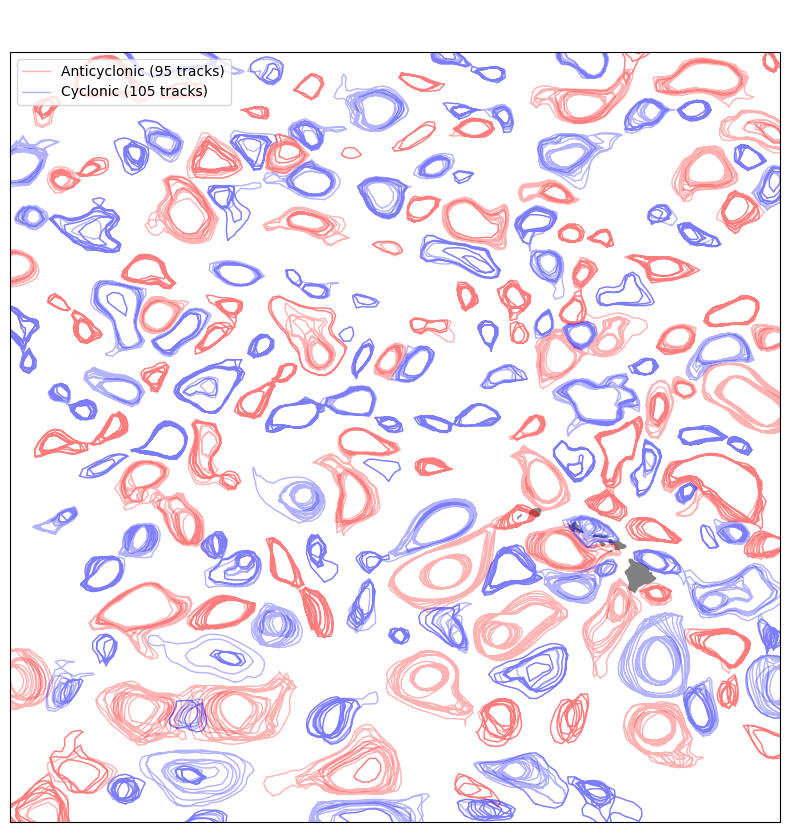

In [21]:
%matplotlib inline
lonshift = 0
proj=ccrs.PlateCarree(central_longitude = lonshift)
fig, ax = plt.subplots(1, 1, figsize=(20, 10), subplot_kw={'projection': proj})
ax.set_title('  ', loc='center', fontsize=30)
ax.set_ylim(10, 40)
ax.set_xlim(-180, -150)

# ax.set_title('2002-01-01 to 2008-12-31', loc='left', fontsize=50)
#ax.set_title('(wavelength,shape_error)'+str(int(wavelength))+' '+str(int(shape_error)), loc='right', fontsize=50)
# gl = ax.gridlines(draw_labels=True, y_inline=True) # need cartopy version 0.18!!!
# gl.top_labels = False
# gl.xformatter = LongitudeFormatter()
# gl.yformatter = LatitudeFormatter()

land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='10m',
        facecolor='grey')
ax.add_feature(land)



a_sub.display(ax, ref=-180, label="Anticyclonic ({nb_tracks} tracks)", color="r", lw=1, alpha=0.3, linestyle="-")
c_sub.display(ax, ref=-180, label="Cyclonic ({nb_tracks} tracks)", color="b", lw=1, alpha=0.3,  linestyle="-")
#ax.plot(np.mod(a_xr.longitude[tt,:], 360), a_xr.latitude[tt,:],linewidth=0.04,transform=ccrs.Geodetic(),c=cline)
ax.legend(fontsize=10, loc='upper left')

# plt.savefig('/home/b/b382618/eddy_figs/20y_1y_eddy_tracks_aviso.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


### 7.3 Get Lagrangian eddies

In [40]:
date_good=20100525

In [41]:
RCLV_data = np.array(RCLV_data,dtype=object)
RCLV_data_this_day = RCLV_data[np.where([r[0]==str(date_good) for r in RCLV_data])[0]]
RCLV_bnds = [r[9:] for r in RCLV_data_this_day] # boundary coordinates

In [57]:
onep=RCLV_bnds[2]
vertices = [[onep[i], onep[i + 1]] for i in range(0, len(onep), 2)]
vertices

[[205.15625, 30.65625],
 [205.1875, 30.625],
 [205.1875, 30.625],
 [205.1875, 30.59375],
 [205.21875, 30.5625],
 [205.21875, 30.5625],
 [205.25, 30.53125],
 [205.25, 30.53125],
 [205.25, 30.5],
 [205.25, 30.46875],
 [205.25, 30.46875],
 [205.25, 30.4375],
 [205.21875, 30.40625],
 [205.21875, 30.40625],
 [205.21875, 30.375],
 [205.1875, 30.34375],
 [205.1875, 30.34375],
 [205.15625, 30.3125],
 [205.15625, 30.28125],
 [205.15625, 30.28125],
 [205.15625, 30.25],
 [205.125, 30.21875],
 [205.125, 30.21875],
 [205.09375, 30.1875],
 [205.09375, 30.1875],
 [205.0625, 30.15625],
 [205.03125, 30.15625],
 [205.03125, 30.15625],
 [205.0, 30.125],
 [205.0, 30.125],
 [204.96875, 30.09375],
 [204.96875, 30.09375],
 [204.9375, 30.0625],
 [204.90625, 30.0625],
 [204.875, 30.09375],
 [204.875, 30.09375],
 [204.84375, 30.125],
 [204.84375, 30.15625],
 [204.84375, 30.1875],
 [204.84375, 30.1875],
 [204.8125, 30.21875],
 [204.8125, 30.21875],
 [204.78125, 30.25],
 [204.78125, 30.28125],
 [204.78125, 30.312

In [58]:
traj_lat=ds_8.lat[:,0].values
traj_lon=ds_8.lon[:,0].values
traj_lat_unique = np.unique(traj_lat)
traj_lon_unique = np.unique(traj_lon)

In [59]:
x_points_inside, y_points_inside = find_polygon_pts(vertices,traj_lon_unique,traj_lat_unique)
eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,0) #day 0 data


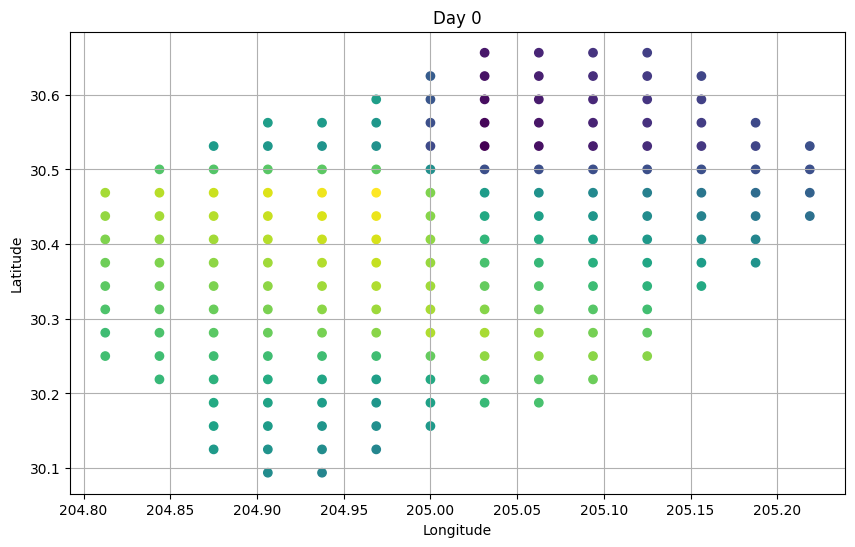

In [60]:
day=0
# eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data

plt.figure(figsize=(10, 6))
plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
# plt.xlim([195.75, 198])  # Set longitude limits
# plt.ylim([18.9, 20.5]) 
plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [61]:
def plot_eddy_track_number(dataset):

    id_list = []
    x_list = []
    y_list = []
    
    track_list = np.unique(dataset.track)
    
    for i in track_list:
        eddy = dataset.extract_ids([i])
        id_list.append(eddy.track[0])
        x_list.append(convert_longitude(eddy.longitude[0]))
        y_list.append(eddy.latitude[0])
    texts = [plt.text(x_list[i], y_list[i], id_list[i], ha='center', va='center') for i in range(len(x_list))]


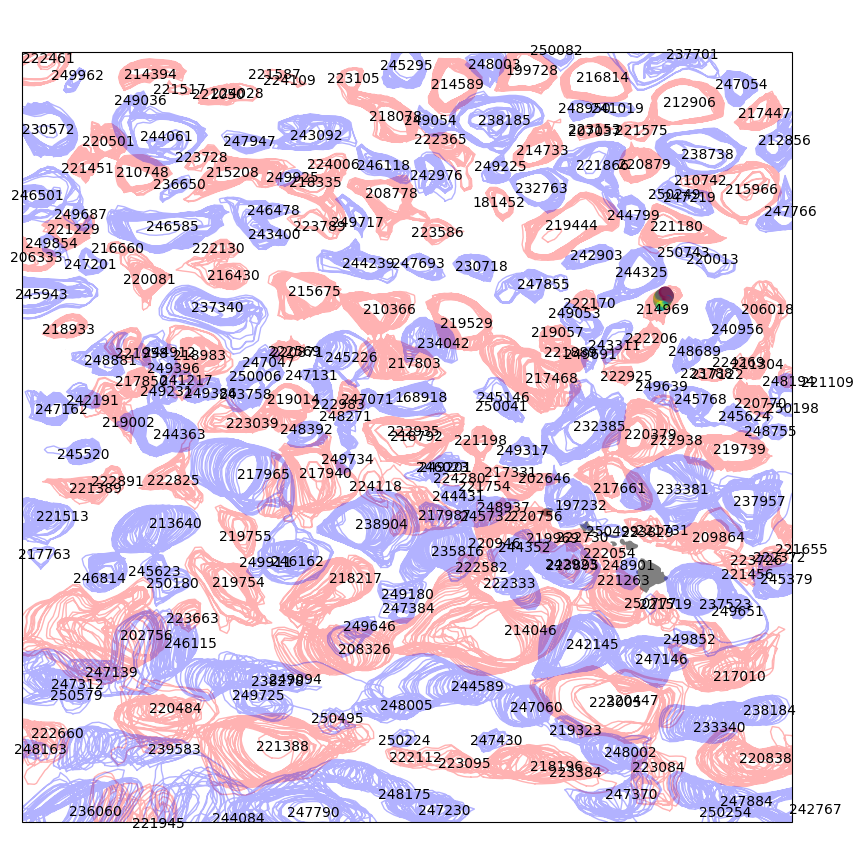

In [62]:
%matplotlib inline
lonshift = 0
proj=ccrs.PlateCarree(central_longitude = lonshift)
fig, ax = plt.subplots(1, 1, figsize=(20, 10), subplot_kw={'projection': proj})
ax.set_title('  ', loc='center', fontsize=30)
ax.set_ylim(10, 40)
ax.set_xlim(-180, -150)

# ax.set_title('2002-01-01 to 2008-12-31', loc='left', fontsize=50)
#ax.set_title('(wavelength,shape_error)'+str(int(wavelength))+' '+str(int(shape_error)), loc='right', fontsize=50)
# gl = ax.gridlines(draw_labels=True, y_inline=True) # need cartopy version 0.18!!!
# gl.top_labels = False
# gl.xformatter = LongitudeFormatter()
# gl.yformatter = LatitudeFormatter()

land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='10m',
        facecolor='grey')
ax.add_feature(land)

plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o')


a_sub.display(ax, ref=-180, label="Anticyclonic ({nb_tracks} tracks)", color="r", lw=1, alpha=0.3, linestyle="-", extern_only=True)
c_sub.display(ax, ref=-180, label="Cyclonic ({nb_tracks} tracks)", color="b", lw=1, alpha=0.3,  linestyle="-", extern_only=True)

plot_eddy_track_number(a_sub)
plot_eddy_track_number(c_sub)


plt.show()

ax.legend(fontsize=10, loc='upper left')

# plt.savefig('/home/b/b382618/eddy_figs/20y_1y_eddy_tracks_aviso.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


In [65]:
eddy = a_sub.extract_ids([208326])
# e=eddy.extract_with_period((22274, 22275))
# ez=eddy.extract_with_period((22267, 22268))

In [66]:
eddy

| 32 observations from 22027.999305555553 to 22058.999305555553 (32.0 days, ~1 obs/day)
    |   Speed area      : 0.02 Mkm²/day
    |   Effective area  : 0.03 Mkm²/day
    ----Distribution in Amplitude:
    |   Amplitude bounds (cm)        0.00      1.00      2.00      3.00      4.00      5.00     10.00    500.00
    |   Percent of eddies         :       0.00      0.00      0.00     40.62     31.25     28.12      0.00
    ----Distribution in Radius:
    |   Speed radius (km)            0.00     15.00     30.00     45.00     60.00     75.00    100.00    200.00   2000.00
    |   Percent of eddies         :       0.00      0.00      0.00      0.00     68.75     31.25      0.00      0.00
    |   Effective radius (km)        0.00     15.00     30.00     45.00     60.00     75.00    100.00    200.00   2000.00
    |   Percent of eddies         :       0.00      0.00      0.00      0.00      0.00     81.25     18.75      0.00
    ----Distribution in Latitude
        Latitude bounds            -90.00    -60.00    -15.00     15.00     60.00     90.00
        Percent of eddies         :       0.00      0.00      0.00    100.00      0.00
        Percent of speed area     :       0.00      0.00      0.00    100.00      0.00
        Percent of effective area :       0.00      0.00      0.00    100.00      0.00
        Mean speed radius (km)    :        nan       nan       nan     74.91       nan
        Mean effective radius (km):        nan       nan       nan     94.74       nan
        Mean amplitude (cm)       :        nan       nan       nan      4.49       nan
    | 1 tracks (32.00 obs/tracks, shorter 32 obs, longer 32 obs)
    |   0 filled observations (0.00 obs/tracks, 0.00 % of total)
    |   Intepolated speed area      : 0.00 Mkm²/day
    |   Intepolated effective area  : 0.00 Mkm²/day
    |   Distance by day             : Mean 9.16 , Median 9.47 km/day
    |   Distance by track           : Mean 274.81 , Median 274.81 km/track
    ----Distribution in lifetime:
    |   Lifetime (days  )            1.00     30.00     90.00    180.00    270.00    365.00   1000.00  10000.00
    |   Percent of tracks         :       0.00    100.00      0.00      0.00      0.00      0.00      0.00
    |   Percent of eddies         :       0.00    100.00      0.00      0.00      0.00      0.00      0.00

NameError: name 'eddy_day0_lons' is not defined

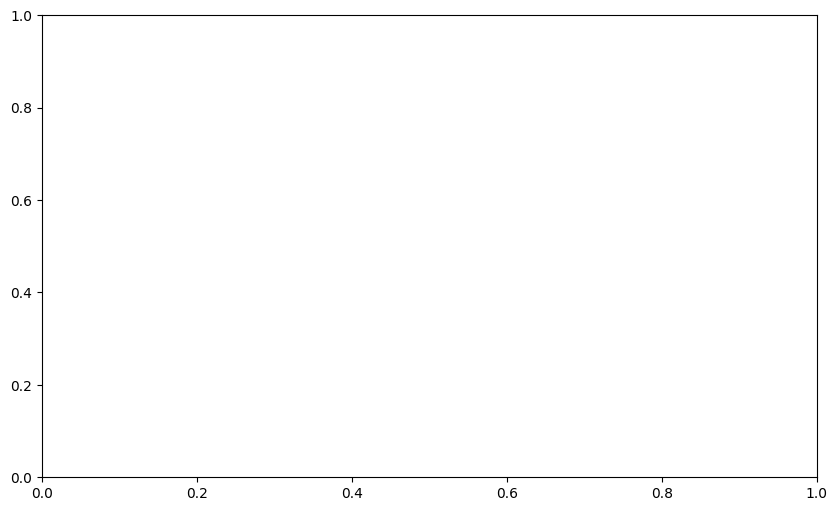

In [17]:
day=0
# eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
# plt.figure(figsize=(10, 6))
plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
# plt.xlim([195.75, 198])  # Set longitude limits
# plt.ylim([18.9, 20.5]) 
e.display(ax=ax, intern_only=True)
plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

### 7.4 select particles within the eulerian eddy

In [18]:
lat_points = e.effective_contour_latitude
lon_points = e.effective_contour_longitude

In [19]:
lat_points = lat_points.flatten()
lon_points = lon_points.flatten()

# Set the number of decimal places
decimal_places = 5

# Create vertices by zipping individual elements, rounded to the specified decimal places
vertices = [(round(float(lon), decimal_places), round(float(lat), decimal_places)) for lon, lat in zip(lon_points, lat_points)]

# vertices = [(float(lat1), float(lon1)) for lat1, lon1 in zip(lat_points, lon_points)]

# vertices = list(zip(e_lat, e_lon))
vertices

[(204.75, 15.0),
 (204.5, 15.06),
 (204.25999, 15.15),
 (204.24001, 15.16),
 (204.11, 15.25),
 (204.0, 15.33),
 (203.84, 15.5),
 (203.72, 15.75),
 (203.72, 15.77),
 (203.7, 16.0),
 (203.74001, 16.25),
 (203.75, 16.28),
 (203.83, 16.5),
 (203.95, 16.75),
 (204.00999, 16.82),
 (204.12, 17.01),
 (204.25, 17.18),
 (204.3, 17.26),
 (204.44, 17.5),
 (204.5, 17.64),
 (204.61, 17.76),
 (204.74001, 17.9),
 (204.75, 17.92),
 (204.99001, 17.86),
 (205.0, 17.85),
 (205.06, 17.75),
 (205.24001, 17.59),
 (205.31, 17.5),
 (205.49001, 17.37),
 (205.62, 17.25),
 (205.75, 17.1),
 (205.84, 17.0),
 (205.97, 16.76),
 (206.0, 16.69),
 (206.07001, 16.51),
 (206.08, 16.49),
 (206.14, 16.24),
 (206.19, 16.0),
 (206.21001, 15.75),
 (206.22, 15.5),
 (206.22, 15.25),
 (206.2, 15.02),
 (206.19, 15.0),
 (206.0, 14.96),
 (205.75999, 14.95),
 (205.5, 14.92),
 (205.25999, 14.92),
 (205.24001, 14.92),
 (205.0, 14.94),
 (204.75, 15.0)]

In [20]:
x_points_inside_e, y_points_inside_e = find_polygon_pts(vertices,traj_lon_unique,traj_lat_unique)
# eddy_day0_lons_e,eddy_day0_lats_e,eddy_day0_vort_e = extract_particles_after_time(ds_8,x_points_inside_e,y_points_inside_e,traj_lon_unique,sim_params,0) #day 0 data


NameError: name 'traj_lon_unique' is not defined

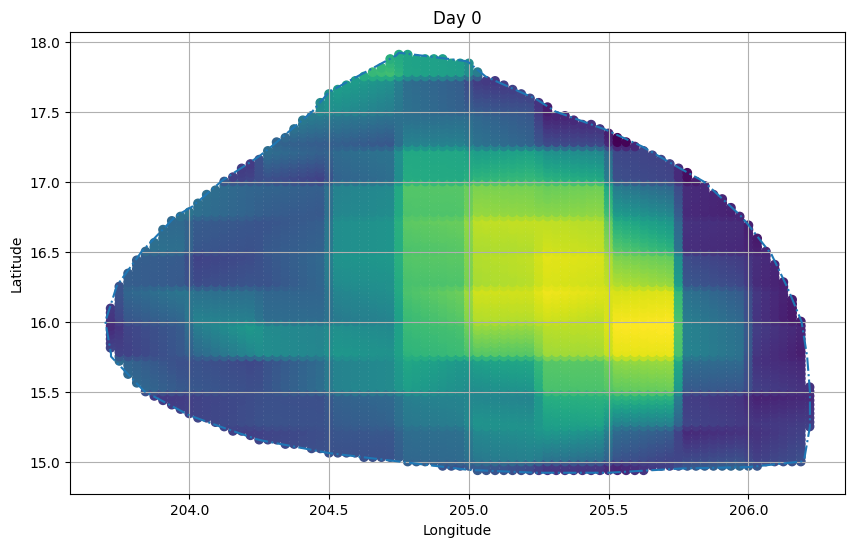

In [68]:
day=0
# eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
# plt.figure(figsize=(10, 6))
plt.scatter(eddy_day0_lons_e, eddy_day0_lats_e, c=eddy_day0_vort_e, marker='o')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
# plt.xlim([195.75, 198])  # Set longitude limits
# plt.ylim([18.9, 20.5]) 
e.display(ax=ax, extern_only=True)
plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [72]:
eddy_day0_lons_e,eddy_day0_lats_e,eddy_day0_vort_e = extract_particles_after_time(ds_8,x_points_inside_e,y_points_inside_e,traj_lon_unique,sim_params,8) #day 0 data

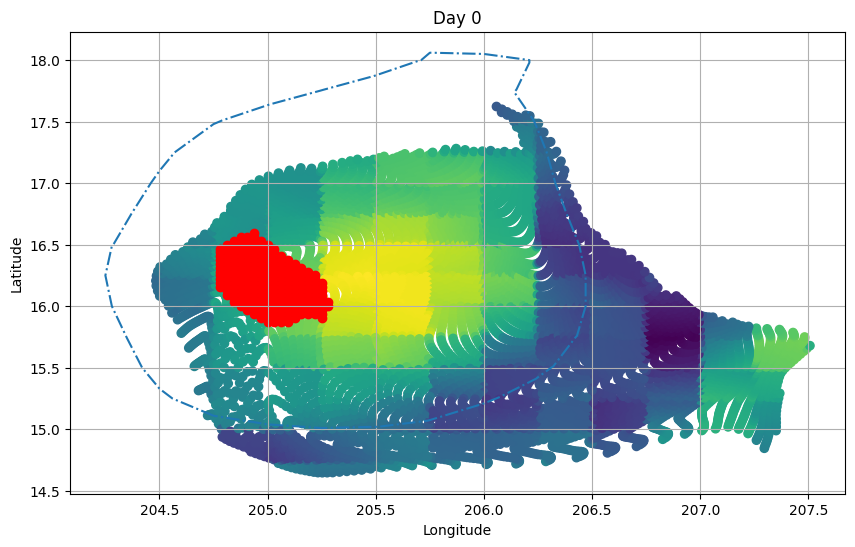

In [76]:
day=0
# eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
# plt.figure(figsize=(10, 6))
plt.scatter(eddy_day0_lons_e, eddy_day0_lats_e, c=eddy_day0_vort_e, marker='o')
plt.scatter(eddy_day0_lons, eddy_day0_lats, color='r', marker='o')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
# plt.xlim([195.75, 198])  # Set longitude limits
# plt.ylim([18.9, 20.5]) 
ez.display(ax=ax, extern_only=True)
plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

### 7.5 Make a nice plot

Eulerian particles

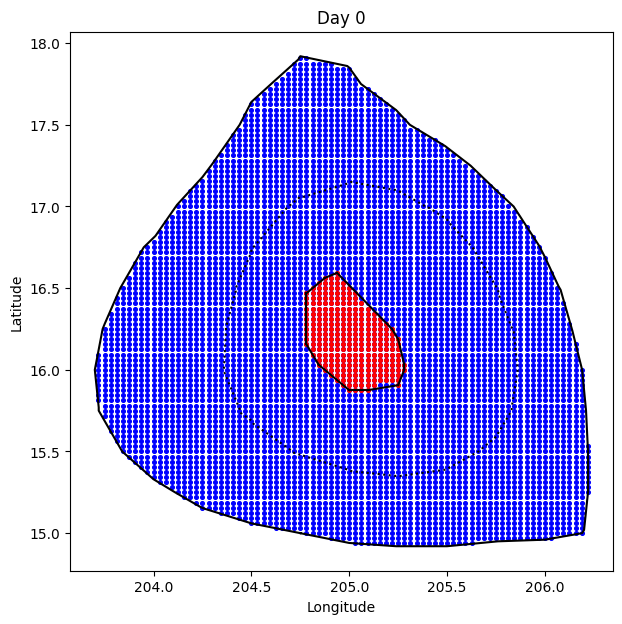

In [38]:
day=0
eddy_day0_lons,eddy_day0_lats,_ = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data
eddy_day0_lons_e,eddy_day0_lats_e,_ = extract_particles_after_time(ds_8,x_points_inside_e,y_points_inside_e,traj_lon_unique,sim_params,day) #day 0 data


fig, ax = plt.subplots(1, 1, figsize=(7, 7))
# plt.figure(figsize=(10, 6))
eul=plt.scatter(eddy_day0_lons_e, eddy_day0_lats_e, color="blue", marker='o', s = 7)
rclv=plt.scatter(eddy_day0_lons, eddy_day0_lats, color="red", marker='o', s = 7)
points = np.column_stack((eddy_day0_lons, eddy_day0_lats))
hull = ConvexHull(points)



# Plot convex hull edges
for simplex in hull.simplices:
    ax.plot(points[simplex, 0], points[simplex, 1], 'black')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
# plt.xlim([195.75, 198])  # Set longitude limits
# plt.ylim([18.9, 20.5]) 
e.display(ax=ax, extern_only=True, linestyle="-", color='black')
e.display(ax=ax, intern_only=True, linestyle="dotted", color='black')
# plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try1_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

## n. add trail after the particles

## n. maybe add the background particles s well

## 8. make into an animation

In [77]:
# Extract latitude, longitude, and time or depth, assuming they're named as such
lons = ds_8['lon']  # Shape: (trajectory, obs)
lats = ds_8['lat']  # Shape: (trajectory, obs)
times = ds_8['time']  # Shape: (trajectory, obs), optional

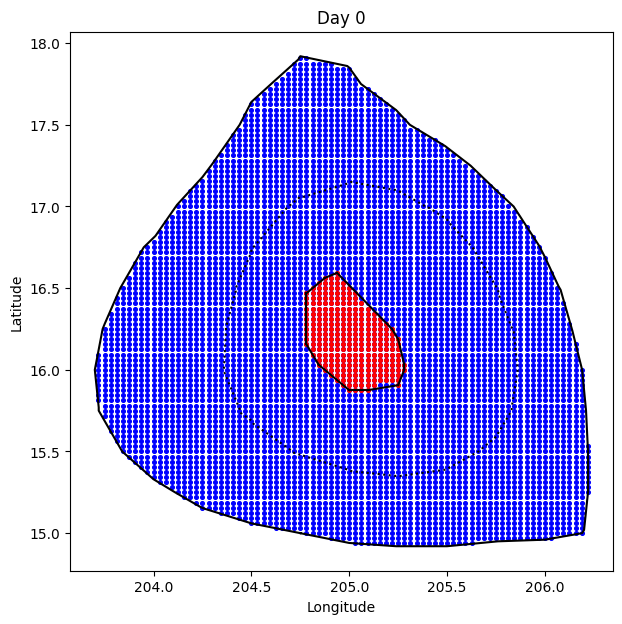

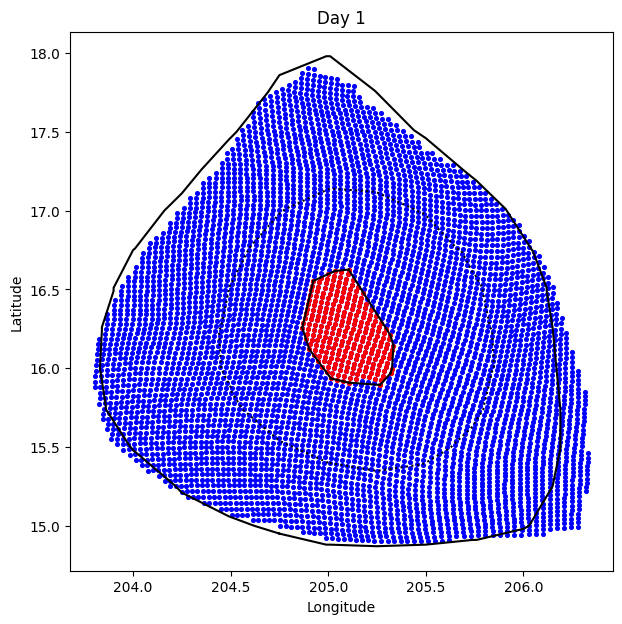

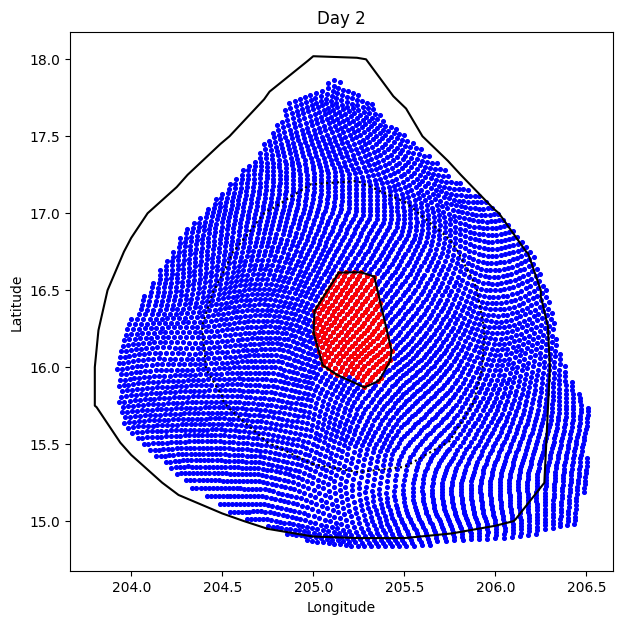

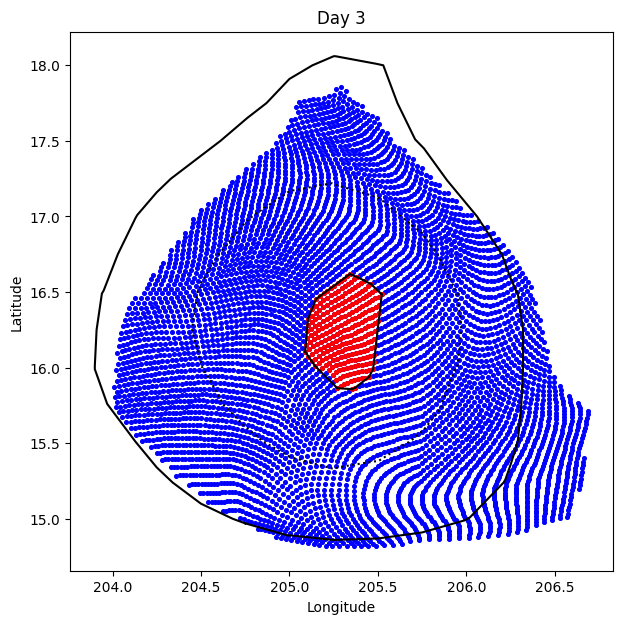

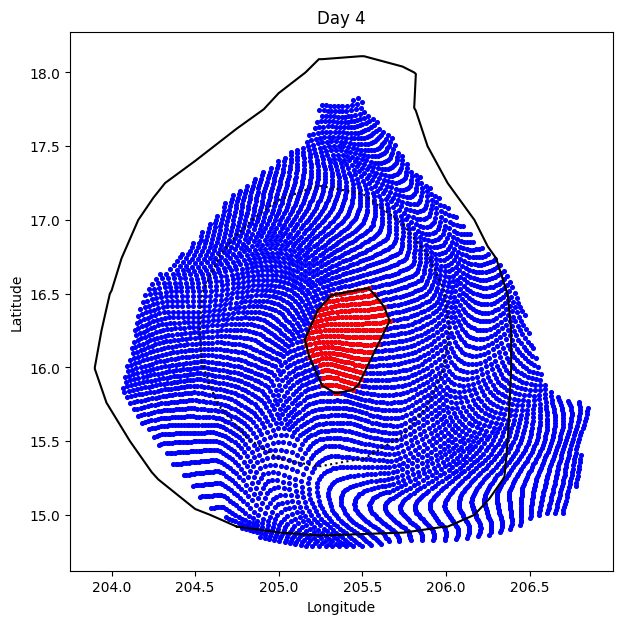

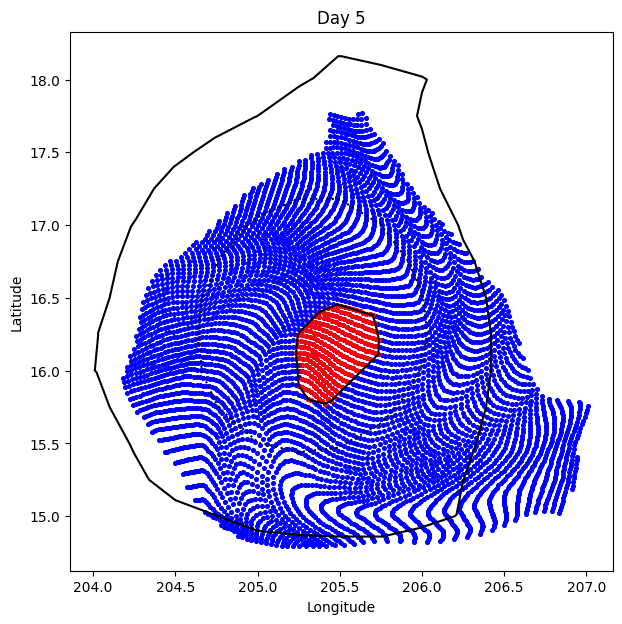

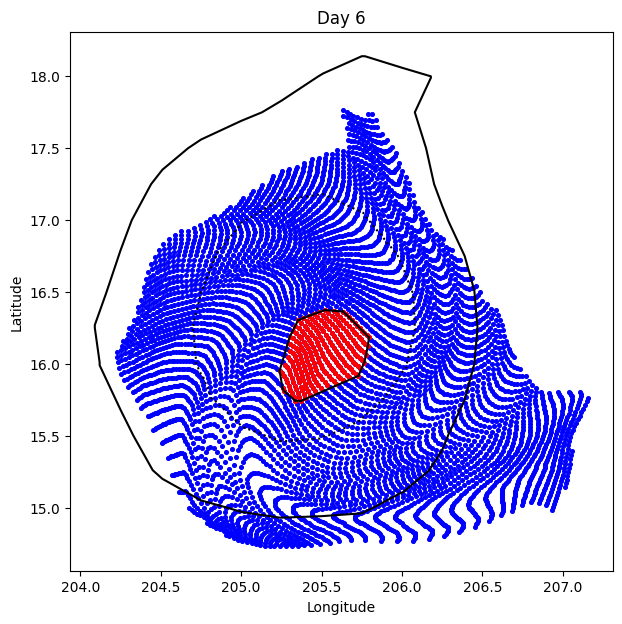

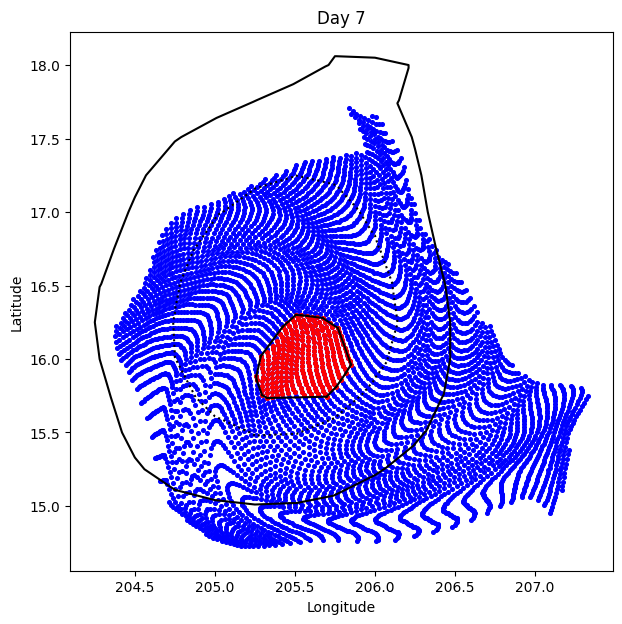

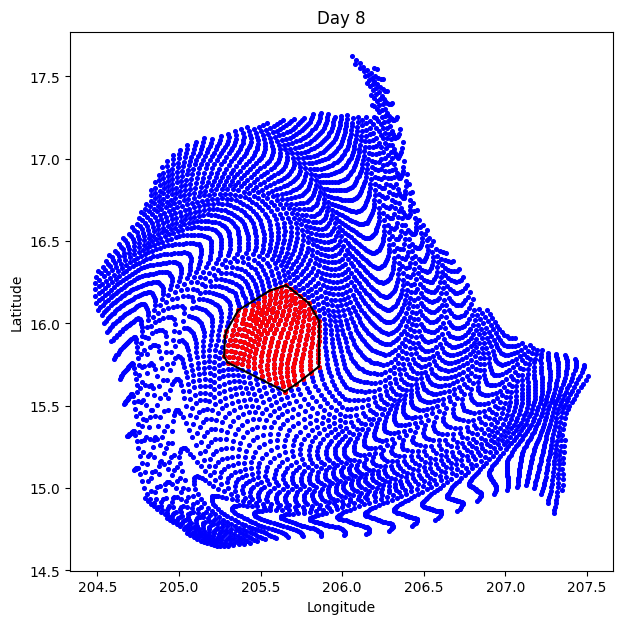

In [40]:
eul_day1 = 22274
eul_day2 = 22275

for i in range(0,9):
    day=i

    ########## for partilces
    eddy_day0_lons,eddy_day0_lats,_ = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data
    eddy_day0_lons_e,eddy_day0_lats_e,_ = extract_particles_after_time(ds_8,x_points_inside_e,y_points_inside_e,traj_lon_unique,sim_params,day) #day 0 data

    fig, ax = plt.subplots(1, 1, figsize=(7, 7))
    eul=plt.scatter(eddy_day0_lons_e, eddy_day0_lats_e, color="blue", marker='o', s = 7)
    rclv=plt.scatter(eddy_day0_lons, eddy_day0_lats, color="red", marker='o', s = 7)
    points = np.column_stack((eddy_day0_lons, eddy_day0_lats))
    hull = ConvexHull(points)
    # Plot convex hull edges
    for simplex in hull.simplices:
        ax.plot(points[simplex, 0], points[simplex, 1], 'black')


    ############ for eulerian outlines

    e=eddy.extract_with_period((eul_day1, eul_day2))
    e.display(ax=ax, extern_only=True, linestyle="-", color='black')
    e.display(ax=ax, intern_only=True, linestyle="dotted", color='black')
    eul_day1=eul_day1-1
    eul_day2=eul_day2-1
    
    # Add labels and title
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title("Day " +str(day))
    # plt.xlim([195.5, 199])  # Set longitude limits
    # plt.ylim([18.8, 20.6]) 
    plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/tr2/one_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()


## Plots with particle trajectories and subselected points

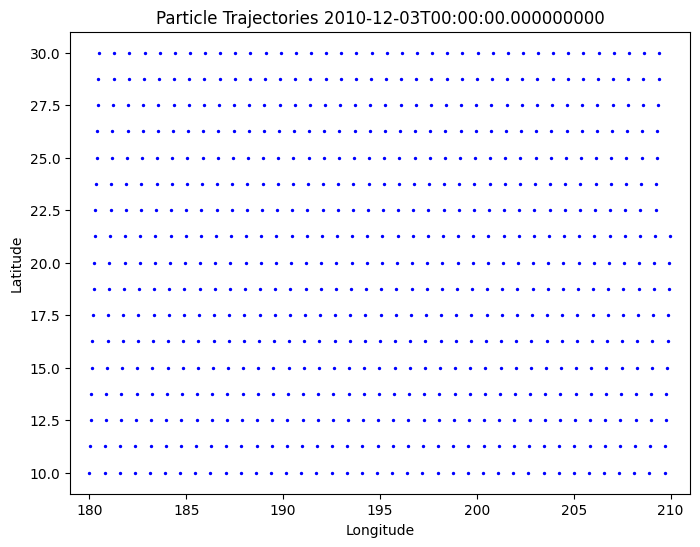

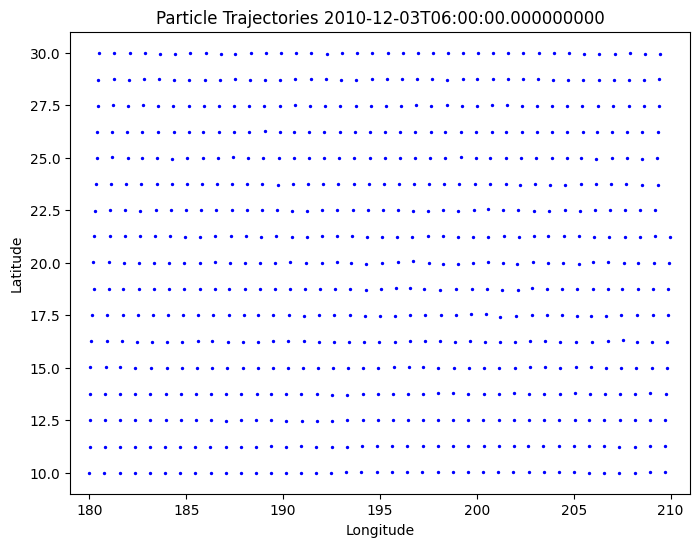

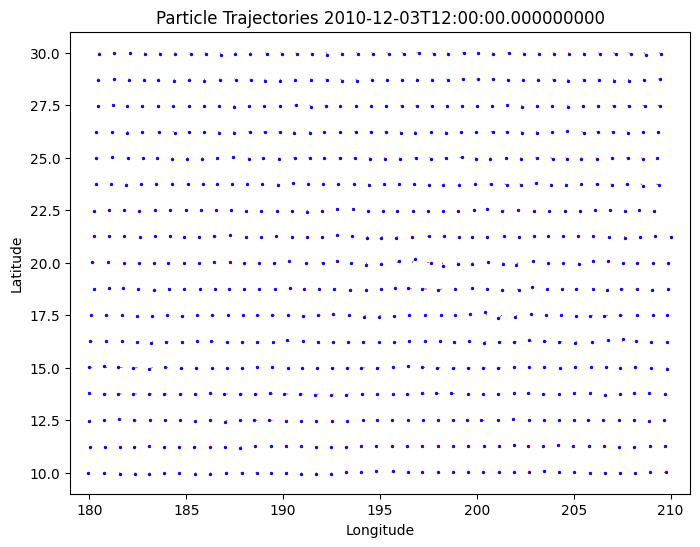

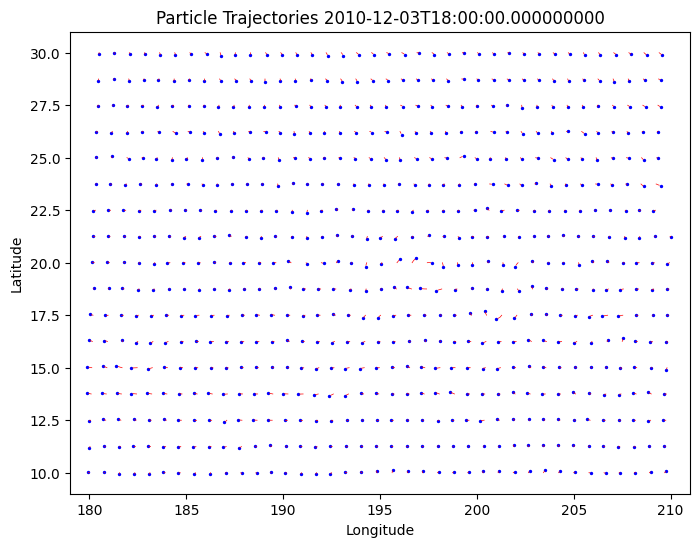

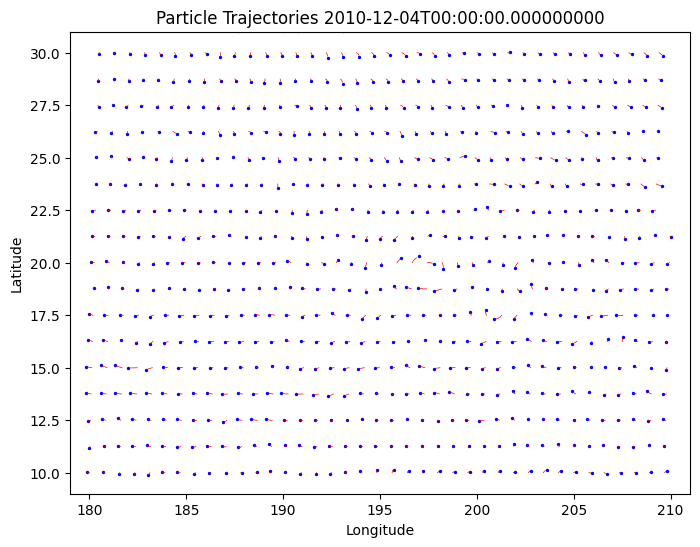

...

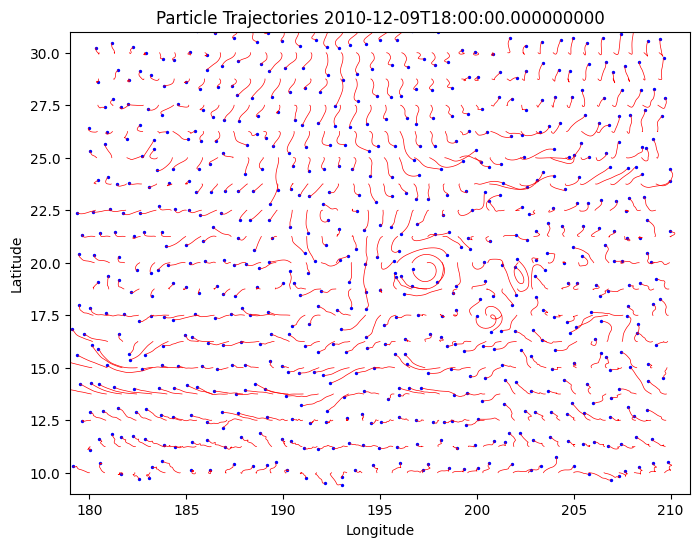

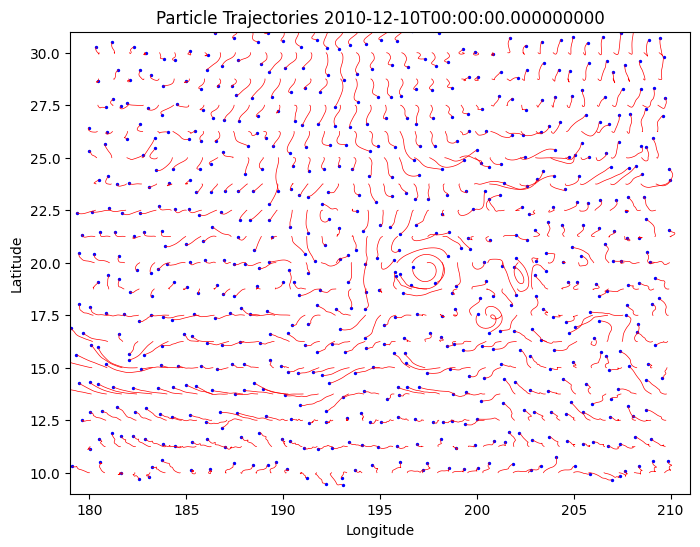

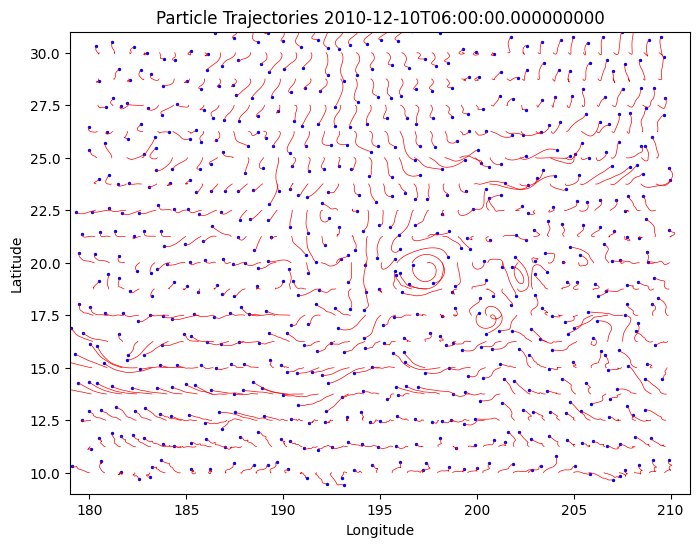

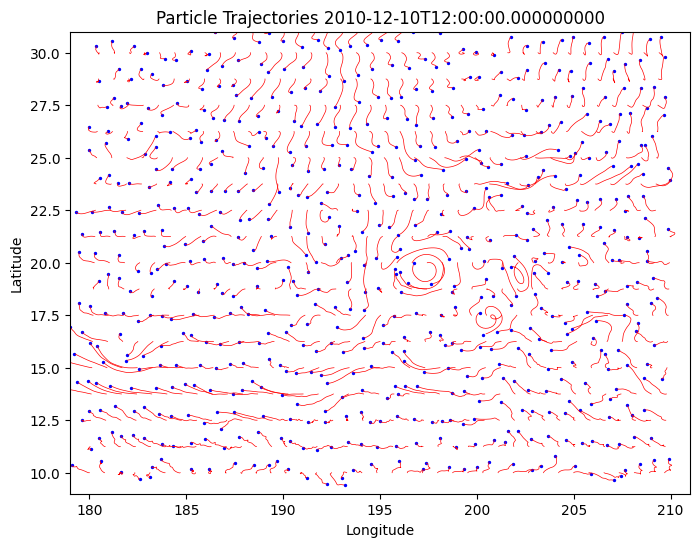

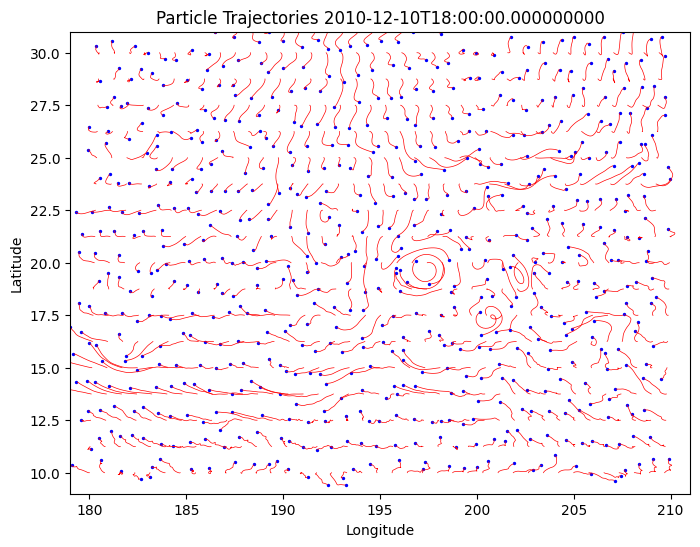

In [14]:
## path script
for t in range(0, times.shape[1]):
    plt.figure(figsize=(8, 6))
    for i in range(0, lons.shape[0], 1000):# Adjust step size as needed for fewer trajectories in the plot
            plt.plot(lons[i, 0:t], lats[i, 0:t], '-', linewidth=0.5, color="r")
            plt.scatter(lons[i, t], lats[i, t], color="blue", marker='o', s = 2)
            # for i in range(0, lons2.shape[0], 10000):  # Adjust step size as needed for fewer trajectories in the plot
            #     plt.plot(lons2[i, :], lats2[i, :], '-', linewidth=0.5, color="b")
    plt.xlim([179, 211])  # Set longitude limits
    plt.ylim([9, 31])    # Set latitude limits        
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Particle Trajectories ' + str(times.values[0][t]))
    # plt.grid(True)
    plt.savefig('/home/b/b382618/eddy_figs/trajectories/trajectories_red_simple/with_particle/'+str(t)+ '.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()


## 6. Plot particle path in the RCLV- NOT DONE

In [ ]:
day=0
eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data

plt.figure(figsize=(10, 6))


plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o')

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
plt.xlim([195.75, 198])  # Set longitude limits
plt.ylim([18.9, 20.5]) 
plt.grid(True)
plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try2_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [117]:
eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,4) #day 0 data


In [120]:
plt.figure(figsize=(10, 6))
lw=2
# plt.grid(True)
for i in range(0, lons.shape[0], 500):# Adjust step size as needed for fewer trajectories in the plot
    plt.plot(eddy_day0_lons, eddy_day0_lats, '-', linewidth=lw, color='#593f62')
# plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o', s=9)

# Add labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Day " +str(day))
plt.xlim([195.5, 199])  # Set longitude limits
plt.ylim([18.8, 20.6]) 

# plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try2_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

TypeError: list indices must be integers or slices, not tuple

<Figure size 1000x600 with 0 Axes>

In [10]:
for i in range(0,9):
    day=i
    eddy_day0_lons,eddy_day0_lats,eddy_day0_vort = extract_particles_after_time(ds_8,x_points_inside,y_points_inside,traj_lon_unique,sim_params,day) #day 0 data
    
    plt.figure(figsize=(10, 6))
    # plt.grid(True)
    for i in range(0, lons.shape[0], 500):# Adjust step size as needed for fewer trajectories in the plot
        plt.plot(lons[i, :], lats[i, :], '-', linewidth=lw, color='#593f62')
    # plt.scatter(eddy_day0_lons, eddy_day0_lats, c=eddy_day0_vort, marker='o', s=9)
    
    # Add labels and title
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title("Day " +str(day))
    plt.xlim([195.5, 199])  # Set longitude limits
    plt.ylim([18.8, 20.6]) 
    
    plt.savefig('/home/b/b382618/eddy_figs/trajectories/one_eddy/try2_'+str(day)+ 'day.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

NameError: name 'x_points_inside' is not defined

## n. DUMP

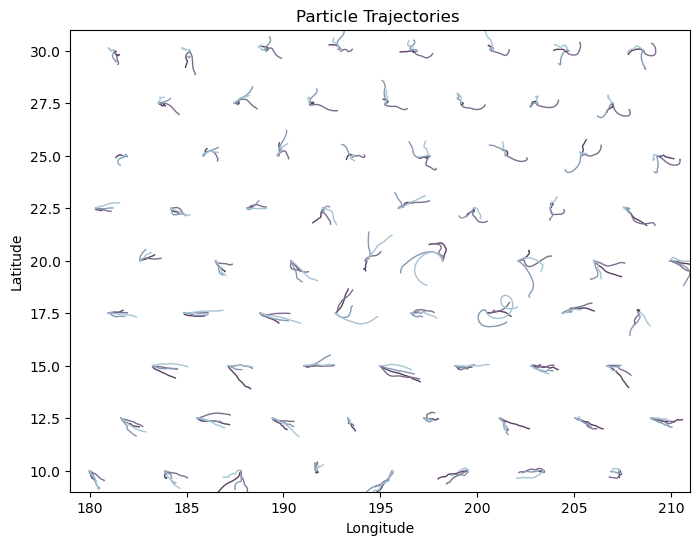

In [29]:
lw=1
plt.figure(figsize=(8, 6))
for i in range(0, lons.shape[0], 10000):# Adjust step size as needed for fewer trajectories in the plot
        plt.plot(lons[i, :], lats[i, :], '-', linewidth=lw, color='#593f62')

# for i in range(0, lons2.shape[0], 10000):  # Adjust step size as needed for fewer trajectories in the plot
#     plt.plot(lons2[i, :], lats2[i, :], '-', linewidth=lw, color='#7b6d8d')

# for i in range(0, lons3.shape[0], 10000):  # Adjust step size as needed for fewer trajectories in the plot
#     plt.plot(lons3[i, :], lats3[i, :], '-', linewidth=lw, color='#8499b1')

# for i in range(0, lons4.shape[0], 10000):  # Adjust step size as needed for fewer trajectories in the plot
#     plt.plot(lons4[i, :], lats4[i, :], '-', linewidth=lw, color='#a5c4d4')





plt.xlim([179, 211])  # Set longitude limits
plt.ylim([9, 31])    # Set latitude limits        
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Particle Trajectories ')
# plt.grid(True)
# plt.savefig('/home/b/b382618/eddy_figs/trajectories/'+str(t)+ '.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()



In [52]:
RCLV_data = np.array(RCLV_data,dtype=object) # Convert the list to a NumPy array
# RCLV_data_this_day = RCLV_data[np.array([r[0] == date_good for r in RCLV_data])]

In [55]:
#### use this to plot for multiple days

ax[0].set_xlabel('Longitude',fontsize=fontsize)
ax[0].set_ylabel('Latitude',fontsize=fontsize)

c = 0
for date in date_list:
    # Load the LAVD data
    LAVD_output_file_path = LAVD_dir + date + '_LAVD_' + filename_str + '.npy'
    LAVD = np.load(LAVD_output_file_path)
    LAVD = np.ma.masked_where(np.isnan(LAVD),LAVD) #Land mask required for the peak_local_max function to work
    LAVD_reshape = np.transpose(np.reshape(LAVD,(len(traj_lon_array),len(traj_lat_array))))

NameError: name 'ax' is not defined

In [30]:
date = str(times.values[0][0])[:10]
date

'2010-12-27'

In [32]:
date_good=str(date.replace("-", ""))
date_good

'20101227'